# Part I
Background 
You are given the Data_Files excel sheet which contains information about potatoes, the company's clients, and a snapshot of client potato positions for a period of time. A quantity of Null represents no position. Management has some questions regarding these data and would like to know your interpretations. You will present your findings at the quarterly management meeting

In [323]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import autocorrelation_plot
import statsmodels
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima_model import ARIMA

In [10]:
#read data
data=pd.ExcelFile("/Users/suedy/Downloads/2_Data_Files.xlsx")
potato_info=pd.read_excel(data,"Potatoes_Info")
client_info=pd.read_excel(data,"Client_Info")
position=pd.read_excel(data,"Potatoes_Positions")

In [11]:
potato_info.head()

,Product ID,Variety Name,Country,Shape of tuber,Colour of skin,Colour of flesh,Depth of eyes,Smoothness of skin,Colour of base of lightsprout,Maturity,Height of plants,Frequency of berries
0,1,Accent,NETHERLANDS,Short - oval,Cream,Light yellow,Shallow - medium,Medium,Pink,Very early to early,Short,Absent
1,2,Accord,NETHERLANDS,Short - oval,Cream,Cream,Shallow,-,Pink,Early,Medium,Few
2,3,Adora,-,Oval,Yellow,Light yellow,Shallow - medium,Smooth,-,First Early,-,Few
3,4,Agria,-,Oval - long,Cream,Deep yellow,Shallow,Medium,Blue,Intermediate,-,Absent
4,5,Almera,-,Oval - long,Cream,Light yellow,Very shallow - shallow,Smooth,Pink,Early,Medium - tall,Medium


In [12]:
client_info.head()

,Client ID,First Name,Last Name,Client Type,Client Location
0,100,Yuri,Lenz,Organic,West
1,99,Yael,Eng,Organic,North
2,98,Willow,Whitman,Organic,Midwest
3,97,Viviana,Guevara,Traditional,Midwest
4,96,Viki,Haywood,Industrial,North


In [13]:
position.head()

,Date,Product ID,Client ID,Price,Quantity
0,2020-05-01,131,38,12.02,7
1,2020-05-01,131,64,12.02,52
2,2020-05-01,131,74,12.02,[NULL]
3,2020-05-01,14,74,12.43,31
4,2020-05-01,14,50,12.43,103


# Which clients have the largest potato stockpile based on market value? 
1. Greate new column "Market Value" to show market value (price*quantity) for each record
2. Greate new column "Daily_total_value_client" to show the daily total stockpile per customer per day and find out the client who get the highest market value per day
<br>
Based on the result, client 82, 27 and 38 have the largest value, and especially client 38 has largest value in marjority days

In [14]:
position['Quantity'].replace('[NULL]',0,inplace = True) #replace all null in Quantity with 0
position["Market Value"]=position["Price"]*position["Quantity"]
position["Daily_total_value_client"]=position.groupby(["Date","Client ID"])['Market Value'].transform(sum)

In [15]:
client_largest_stockpile=list(position.loc[position.groupby(["Date"])['Daily_total_value_client'].idxmax(),"Client ID"])
for client in list(set(client_largest_stockpile)):
    print ("Client ID {} : {}".format(client,client_largest_stockpile.count(client)))

Client ID 82 : 1
Client ID 27 : 2
Client ID 38 : 84


# Which clients are the most active?
1. Indicators to represent activeness: count of distinct potato type, sum of quantity, count of active days 
2. Create new column "count_client", which count the number of records(count of potato type)per customer per day and find out the client with highest count per day
<br>
Based on the count of distinct potato type, Client 38, 50 are most active, especailly 38 has been active for most days
3. Create new column "quantity_client", which shows the total quantity of potato per cusomer per day
<br>
Based on the count of distinct potato type, Client 82,27,38 are most active, especailly 38 has been active for most days
4. Calculate the sum of active days for each customer
<br>
Based on the result, Client 17, 27, 30, 38, 44, 49, 50, 52, 64, 74, 82, 89, 94 have the most active days
5. Combined the performance of three indicators, I think Clinet 38 is most active, and Client 50, 82, 27 are also more active than mojority clients


In [43]:
#count of distinct potato type(include no postion)
position["count_client"]=position.groupby(["Date","Client ID"])["Product ID"].transform("count")
client_active=list(position.loc[position.groupby(["Date"])['count_client'].idxmax(),"Client ID"])
for client in list(set(client_active)):
    print ("Client ID {} : {}".format(client,client_active.count(client)))

Client ID 50 : 1
Client ID 38 : 86


In [52]:
#count of distinct potato type(exclude no postion)
position_ex=position[position["Quantity"]>0].reindex()
position_ex["count_client"]=position_ex.groupby(["Date","Client ID"])["Product ID"].transform("count")
client_active=list(position_ex.loc[position_ex.groupby(["Date"])['count_client'].idxmax(),"Client ID"])
for client in list(set(client_active)):
    print ("Client ID {} : {}".format(client,client_active.count(client)))

Client ID 38 : 87


In [17]:
#Sum of quantity(include no postion)
position["quantity_client"]=position.groupby(["Date","Client ID"])["Quantity"].transform("sum")
client_active=list(position.loc[position.groupby(["Date"])['quantity_client'].idxmax(),"Client ID"])
for client in list(set(client_active)):
    print ("Client ID {} : {}".format(client,client_active.count(client)))

Client ID 82 : 1
Client ID 27 : 2
Client ID 38 : 84


In [55]:
#Sum of quantity(exclude no postion)
position_ex["quantity_client"]=position_ex.groupby(["Date","Client ID"])["Quantity"].transform("sum")
client_active=list(position_ex.loc[position_ex.groupby(["Date"])['quantity_client'].idxmax(),"Client ID"])
for client in list(set(client_active)):
    print ("Client ID {} : {}".format(client,client_active.count(client)))

Client ID 82 : 1
Client ID 27 : 2
Client ID 38 : 84


In [40]:
#active days(include no postion)
group=position.groupby("Client ID")["Date"].agg(["nunique"])
group[group["nunique"]==max(group["nunique"])]

,nunique
Client ID,
17,87
27,87
30,87
38,87
44,87
49,87
50,87
52,87
64,87


In [56]:
#active days(exclude no postion)
group=position_ex.groupby("Client ID")["Date"].agg(["nunique"])
group[group["nunique"]==max(group["nunique"])]

,nunique
Client ID,
17,87
27,87
30,87
38,87
44,87
49,87
50,87
52,87
64,87


# Which potatoes are most activity traded?
1. Create new column "count_potato", which count the records per product per day and find out the potato with highest count per day
<br>
Based on the result, Product 16 is most active
2. Create new column "quantity_potato", which shows the total quantity of potato per potato per day
<br>
Based on the result, Product 73, 93 are most active
3. Calculate active days for each potato
<br>
Since many potato types all have records every day, this indictor is not representative for activeness

In [136]:
#Count of distinct records/clients (include no position)
position["count_potato"]=position.groupby(["Date","Product ID"])["Client ID"].transform("count")
potato_active=list(position.loc[position.groupby(["Date"])['count_potato'].idxmax(),"Product ID"])
for potato in list(set(potato_active)):
    print ("Product ID {} : {}".format(potato,potato_active.count(potato)))

Product ID 16 : 58
Product ID 172 : 24
Product ID 45 : 5


In [57]:
#Count of distinct records/clients (exclude no position)
position_ex["count_potato"]=position_ex.groupby(["Date","Product ID"])["Client ID"].transform("count")
potato_active=list(position_ex.loc[position_ex.groupby(["Date"])['count_potato'].idxmax(),"Product ID"])
for potato in list(set(potato_active)):
    print ("Product ID {} : {}".format(potato,potato_active.count(potato)))

Product ID 16 : 71
Product ID 172 : 9
Product ID 45 : 7


In [64]:
#Sum of quantity(include no postion)
position["quantity_potato"]=position.groupby(["Date","Product ID"])["Quantity"].transform("sum")
potato_active=list(position.loc[position.groupby(["Date"])['quantity_potato'].idxmax(),"Product ID"])
for potato in list(set(potato_active)):
    print ("Product ID {} : {}".format(potato,potato_active.count(potato)))

Product ID 73 : 45
Product ID 10 : 2
Product ID 172 : 1
Product ID 45 : 5
Product ID 14 : 1
Product ID 242 : 1
Product ID 146 : 1
Product ID 281 : 1
Product ID 251 : 1
Product ID 93 : 23
Product ID 159 : 6


In [65]:
#Sum of quantity(exclude no postion)
position_ex["quantity_potato"]=position_ex.groupby(["Date","Product ID"])["Quantity"].transform("sum")
potato_active=list(position_ex.loc[position_ex.groupby(["Date"])['quantity_potato'].idxmax(),"Product ID"])
for potato in list(set(potato_active)):
    print ("Product ID {} : {}".format(potato,potato_active.count(potato)))

Product ID 73 : 45
Product ID 10 : 2
Product ID 172 : 1
Product ID 45 : 5
Product ID 14 : 1
Product ID 242 : 1
Product ID 146 : 1
Product ID 281 : 1
Product ID 251 : 1
Product ID 93 : 23
Product ID 159 : 6


In [62]:
#active days(include no postion): 75 potato types keep active for maximum days
group=position.groupby("Product ID")["Date"].agg(["nunique"])
group[group["nunique"]==max(group["nunique"])].shape[0]

75

In [63]:
#active days(exclude no postion): 65 potato types keep active for maximum days
group=position_ex.groupby("Product ID")["Date"].agg(["nunique"])
group[group["nunique"]==max(group["nunique"])].shape[0]

65

# What client activity trends do you see?
Indicators1(per client): count of distinct potato type, stockpile, quantity, count of distinct clients
<br>
Indicators2(overall trend): average of indicators1
1. The count of distinct potato type per client per day
<br>
Indicators1: There are four types of client activity trends 
<br>
-Type1: basically steady and highly active (Client 38, 74)
<br>
-Type2: unsteady and lowly active (Client 44,27)
<br>
-Type3: Extremely high volatility(Client 50)
<br>
-Type4: basically steady and lowly active (Most Clients)
<br>
Indicators2: May-Jun(Down); Jun-Jul(Up); Jul-Aug(Unsteady); Aug-Sep(Down)
<br>
Summary: apart from extreme cases, most clients are less active after August and quantity value of many fluctuations are not recorded
2. The sum of stockpile
<br>
Indicators1:There are four types of client activity trends
<br>
-Type1: extreme large stockpile(Client 38, 27, 82)
<br>
-Type2: steady stockpile with similar trend (Client 74, 30, 89, 64)
<br>
-Type3: unsteady stockpile (Client 77)
<br>
-Type4: steady stockpile without similar trend (rest of clients)
<br>
Indicators2:There is a drop of average stockpile at the start/end of month. 
<br>
May-Jun(Down); Jun-Aug(Up);Aug-Sep(Down-Up) 
3. The sum of quantity: quite similar with sum of stockpile
4. The count of distinct client: more clients join in mid-Aug

Text(0, 0.5, 'Count of distinct potato type')

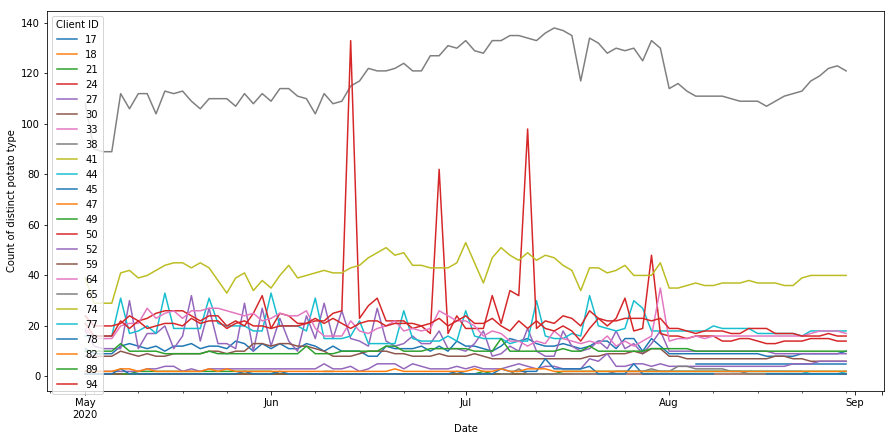

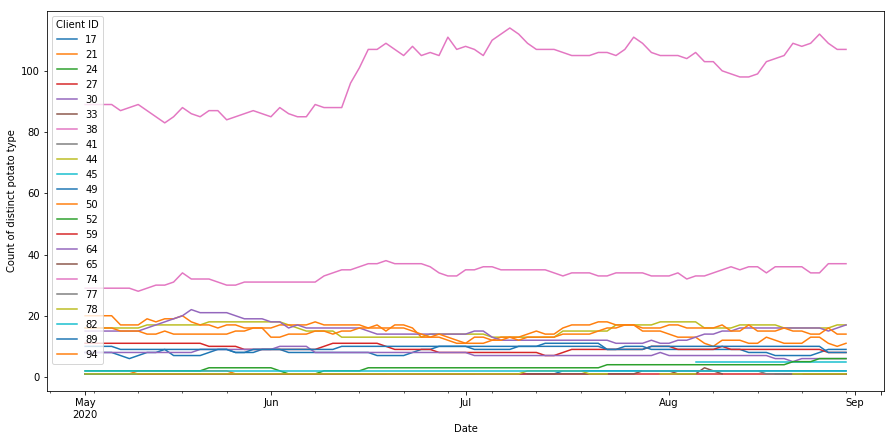

In [86]:
#Count of distinct potato type trend per client(include no position)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID']).count()['Product ID'].unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Count of distinct potato type')

#Count of distinct potato type trend per client(exclude no position)
fig, ax = plt.subplots(figsize=(15,7))
position_ex.groupby(['Date','Client ID']).count()['Product ID'].unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Count of distinct potato type')

Text(0, 0.5, 'Average count of distinct potato type')

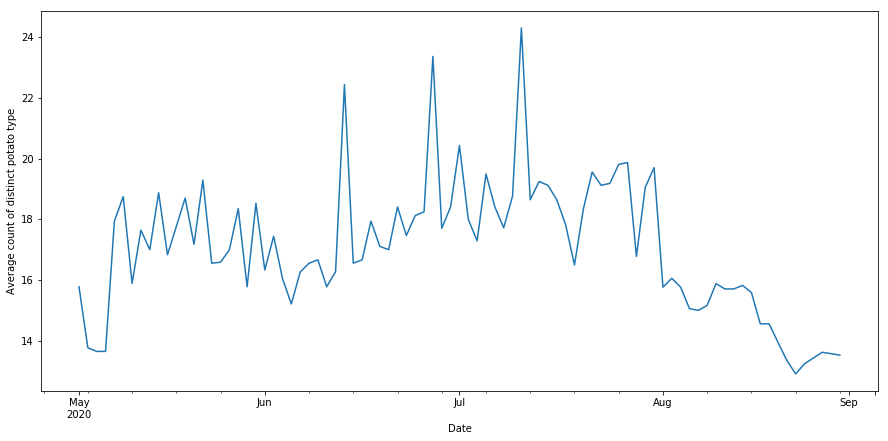

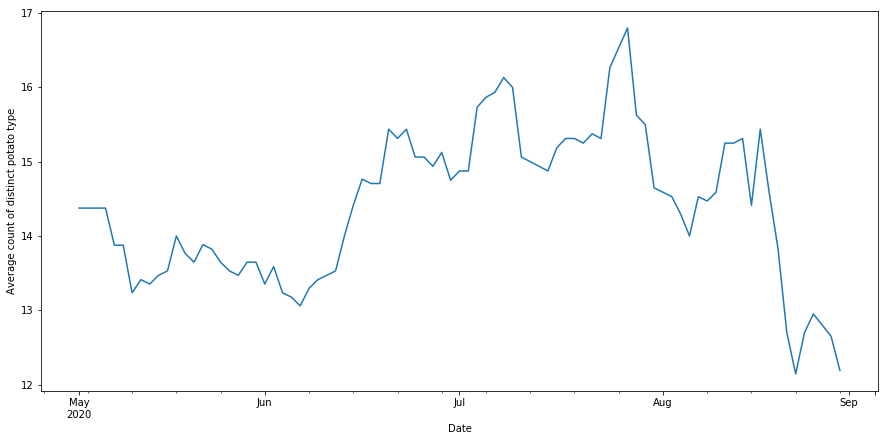

In [107]:
#Average count of distinct potato type(include no position)
fig, ax = plt.subplots(figsize=(15,7))
x=position.groupby(['Date','Client ID']).count()["Product ID"]
x.groupby("Date").mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average count of distinct potato type')

#Average count of distinct potato type(exclude no position)
fig, ax = plt.subplots(figsize=(15,7))
x=position_ex.groupby(['Date','Client ID']).count()["Product ID"]
x.groupby("Date").mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average count of distinct potato type')

Text(0, 0.5, 'Sum of stockpile')

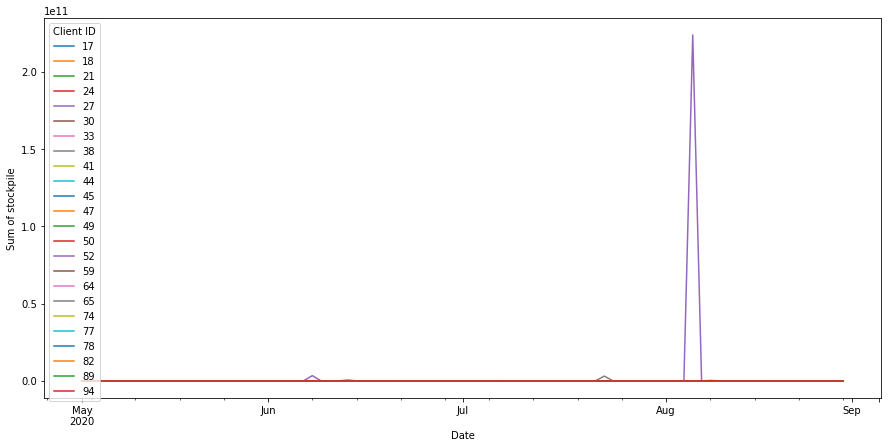

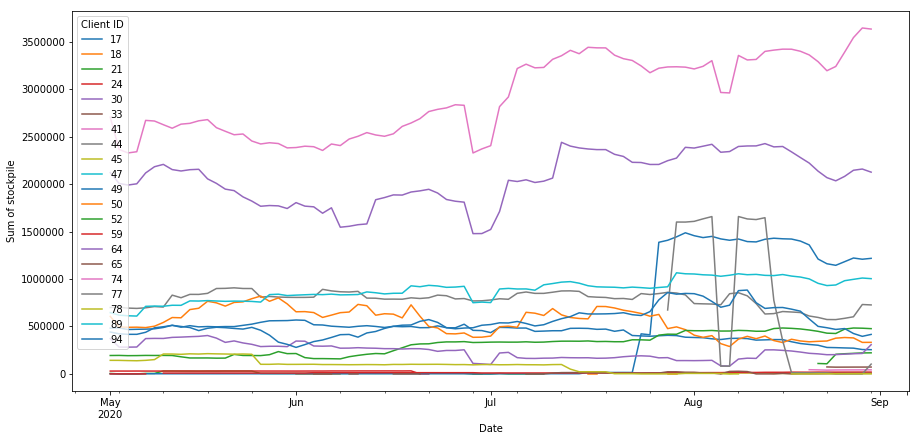

In [87]:
#Sum of stockpile(include Client 27, 38, 82)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID'])['Daily_total_value_client'].mean().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of stockpile')

#Sum of stockpile(exclude Client 27, 38, 82)
position_ex_3= position[~position['Client ID'].isin([27,38,82])]
fig, ax = plt.subplots(figsize=(15,7))
position_ex_3.groupby(['Date','Client ID'])['Daily_total_value_client'].mean().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of stockpile')

Text(0, 0.5, 'Average sum of stockpile')

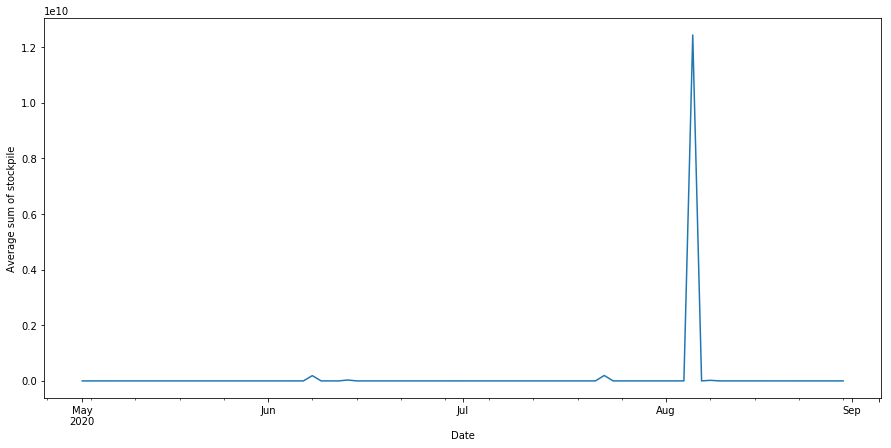

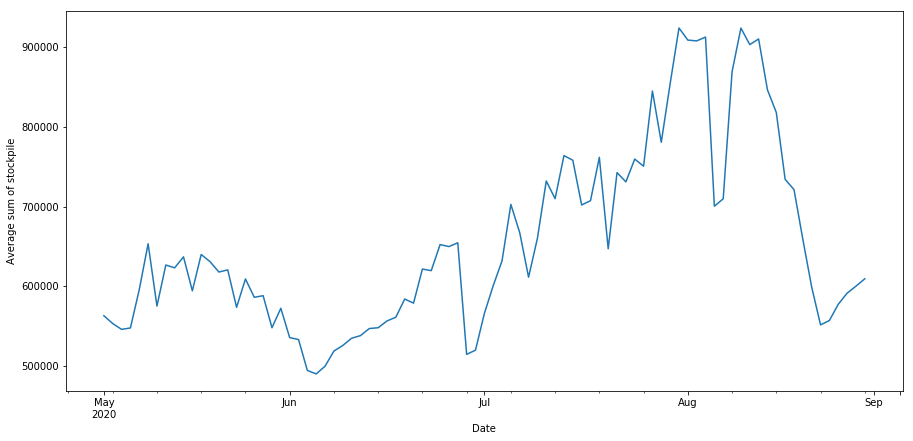

In [110]:
#Average sum of stockpile(include Client 27, 38, 82)
fig, ax = plt.subplots(figsize=(15,7))
x=position.groupby(['Date','Client ID'])["Market Value"].sum()
x.groupby("Date").mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average sum of stockpile')

#Average sum of stockpile(exclude Client 27, 38, 82)
fig, ax = plt.subplots(figsize=(15,7))
x=position_ex_3.groupby(['Date','Client ID'])["Market Value"].sum()
x.groupby("Date").mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average sum of stockpile')

Text(0, 0.5, 'Sum of quantity')

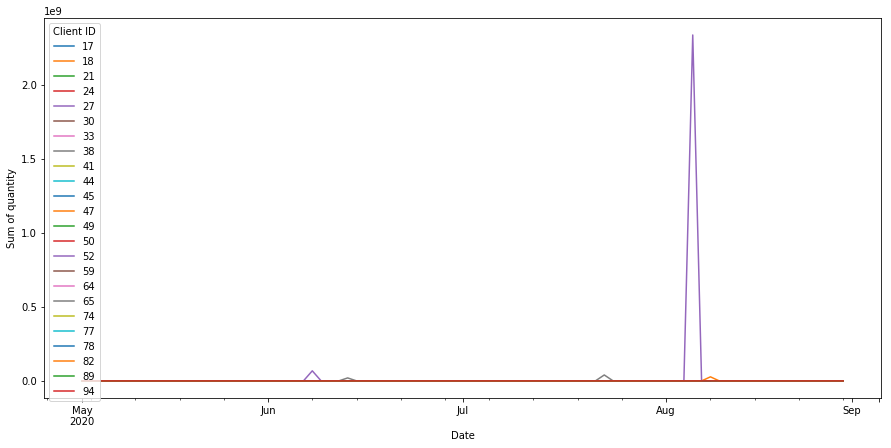

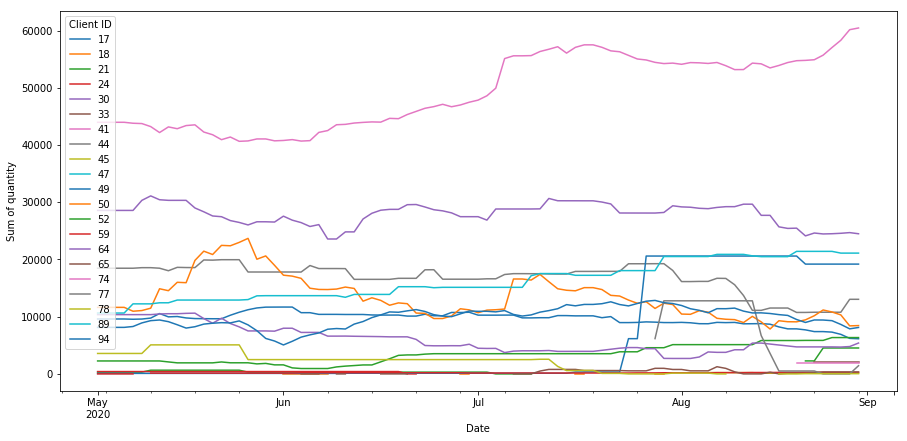

In [88]:
#Sum of quantity(include Client 27, 38, 82)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID'])['Quantity'].sum().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of quantity')

#Sum of quantity(exclude Client 27, 38, 82)
position_ex_3= position[~position['Client ID'].isin([27,38,82])]
fig, ax = plt.subplots(figsize=(15,7))
position_ex_3.groupby(['Date','Client ID'])['Quantity'].sum().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of quantity')

Text(0, 0.5, 'Average sum of quantity')

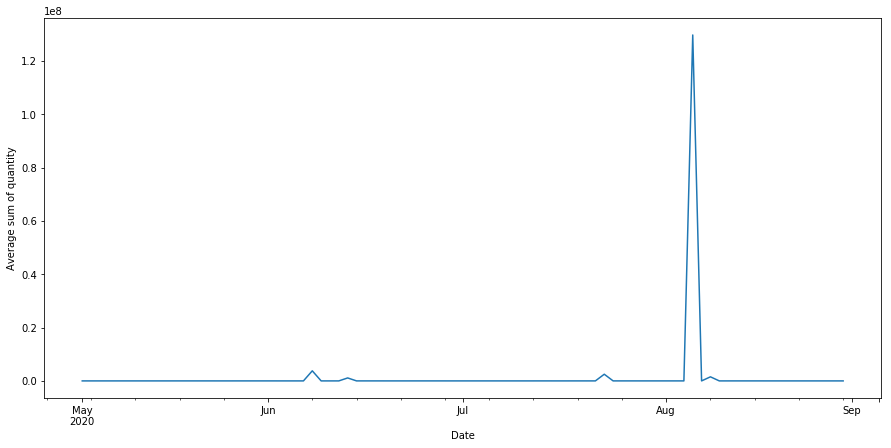

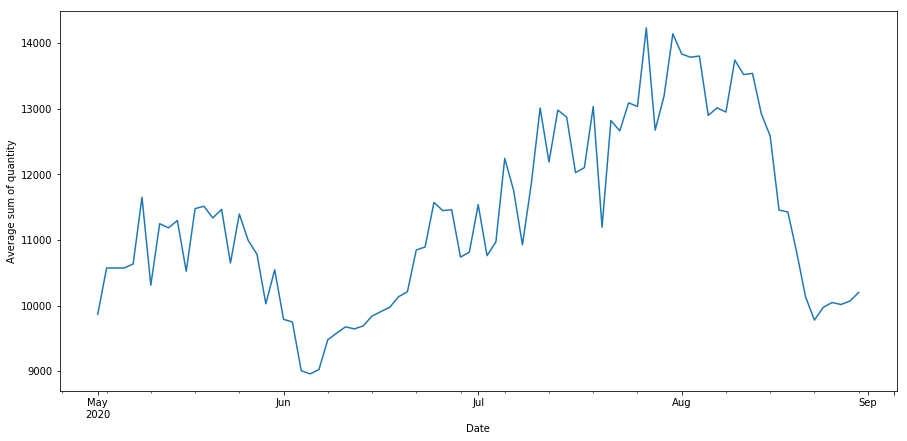

In [112]:
#Average sum of quantity(include Client 27, 38, 82)
fig, ax = plt.subplots(figsize=(15,7))
x=position.groupby(['Date','Client ID'])["Quantity"].sum()
x.groupby("Date").mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average sum of quantity')

#Average sum of quantity(exclude Client 27, 38, 82)
fig, ax = plt.subplots(figsize=(15,7))
x=position_ex_3.groupby(['Date','Client ID'])["Quantity"].sum()
x.groupby("Date").mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average sum of quantity')

Text(0, 0.5, 'Count of active clients')

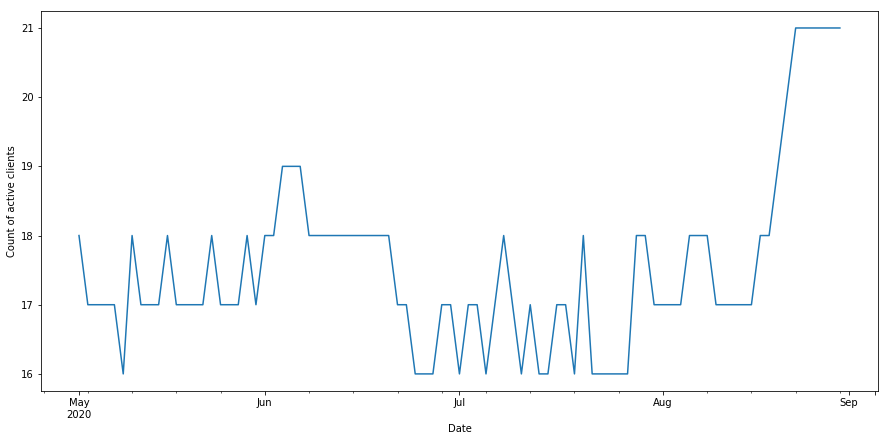

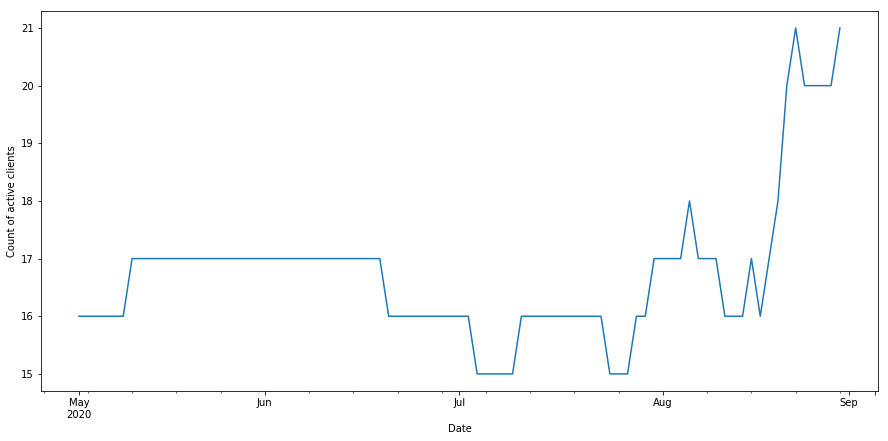

In [97]:
#Active Clients(include no position)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date'])['Client ID'].nunique().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Count of active clients')

#Active Clients(exclude no position)
fig, ax = plt.subplots(figsize=(15,7))
position_ex.groupby(['Date'])['Client ID'].nunique().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Count of active clients')

# Clients' activity based on products' activity
Indicators(per product): quantity, count of distinct products
<br>
1. The sum of quantity: random pattern for each product
3. The count of distinct product: May-Jul(Up); Jul-Aug(Keep);Aug-Sep(Valley)

Text(0, 0.5, 'Sum of quantity')

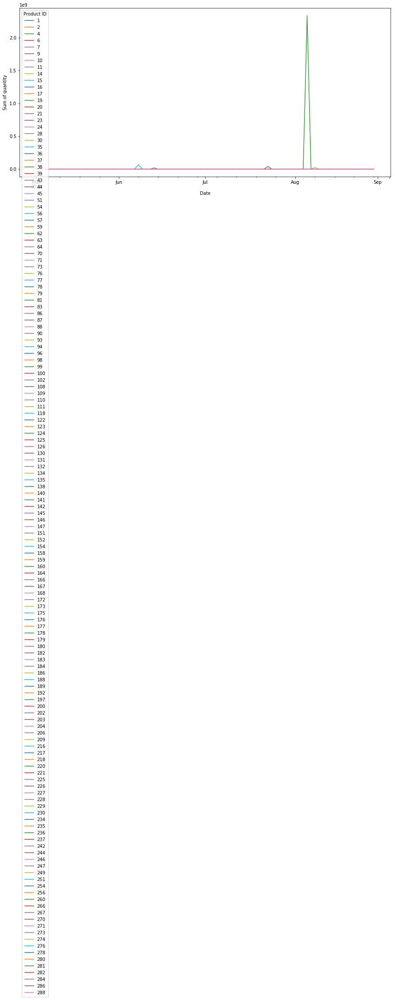

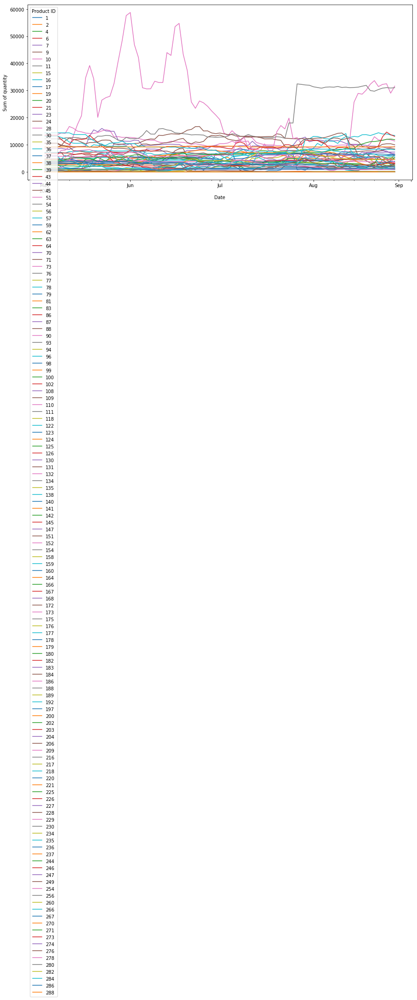

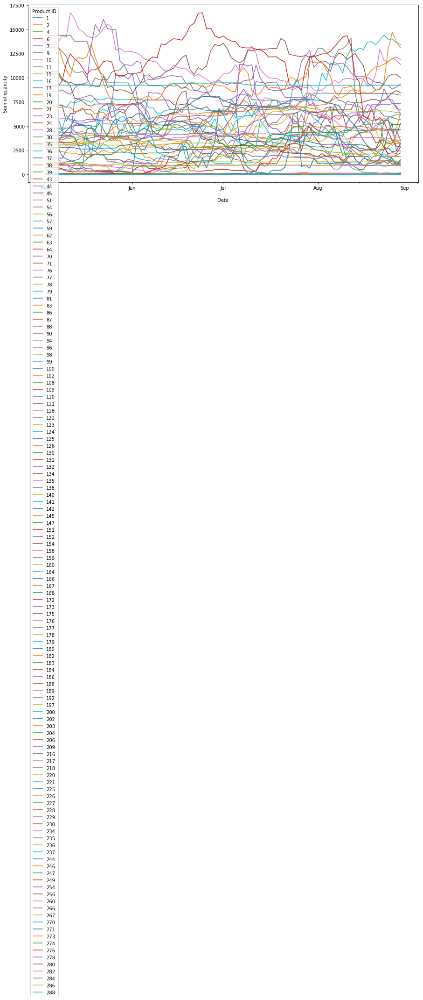

In [122]:
#Sum of quantity(include Product 281, 146, 14, 251, 242)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Product ID'])['Quantity'].sum().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of quantity')

#Sum of quantity(exclude Product 281, 146, 14, 251, 242)
fig, ax = plt.subplots(figsize=(15,7))
position[~position["Product ID"].isin([281, 146, 14, 251, 242])].groupby(['Date','Product ID'])['Quantity'].sum().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of quantity')

#Sum of quantity(exclude Product 73, 93, 281, 146, 14, 251, 242)
fig, ax = plt.subplots(figsize=(15,7))
position[~position["Product ID"].isin([73,93,281, 146, 14, 251, 242])].groupby(['Date','Product ID'])['Quantity'].sum().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Sum of quantity')


Text(0, 0.5, 'Count of active potato')

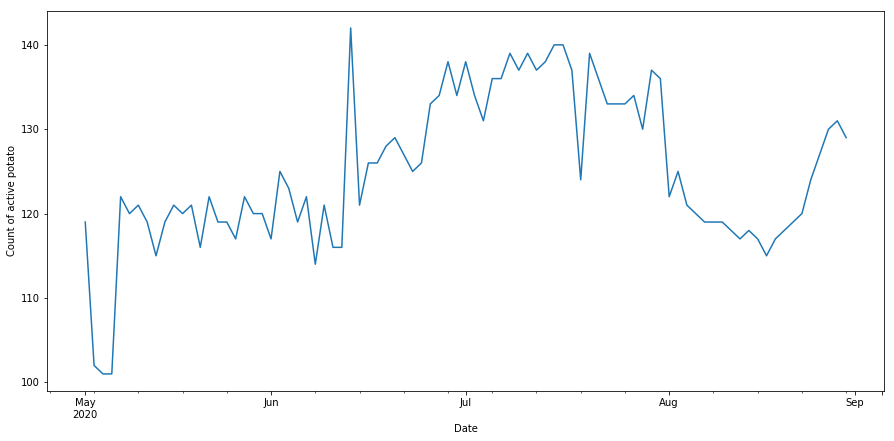

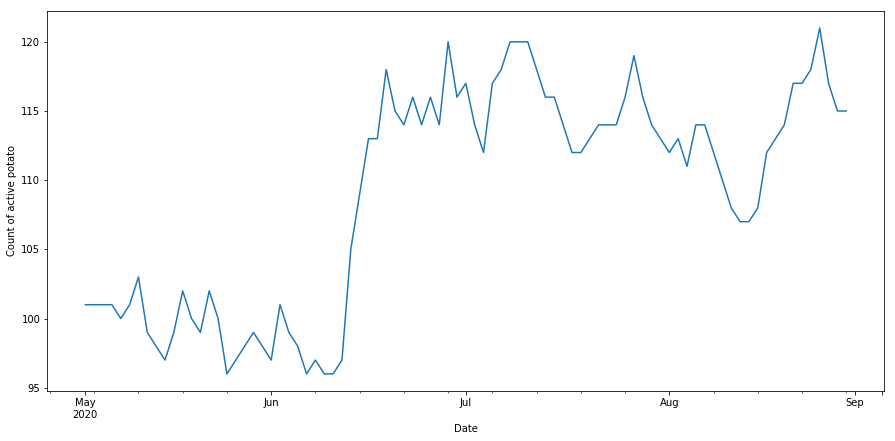

In [124]:
#Active Products(include no position)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date'])['Product ID'].nunique().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Count of active potato')

#Active Products(exclude no position)
fig, ax = plt.subplots(figsize=(15,7))
position_ex.groupby(['Date'])['Product ID'].nunique().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Count of active potato')

# What potato price trends do you see?
1. the price for each product
<br>
-Basically the trend of price are steady for most potatoes, but some always have high price(Product ID 11,236,227), rest of them are of relatively low price. 
<br>
-Majority prices show a "valley" around Aug 24th-25th
2. the average price of potatoes per day
May-Jun(Up); Jun-Aug(Keep); Aug-Sep(Valley)

Text(0, 0.5, 'Potato Price')

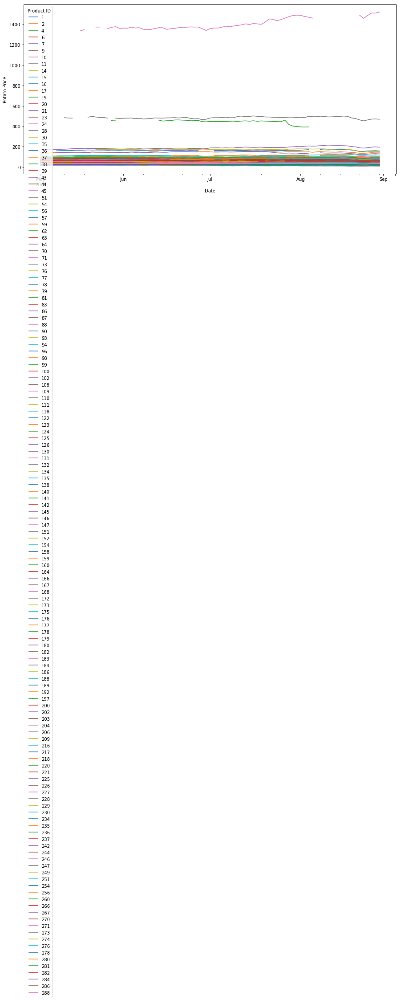

In [143]:
#Potato Price Trend Plot(include Product 227, 11, 236)
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Product ID'])['Price'].mean().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Potato Price')

Text(0, 0.5, 'Potato Price')

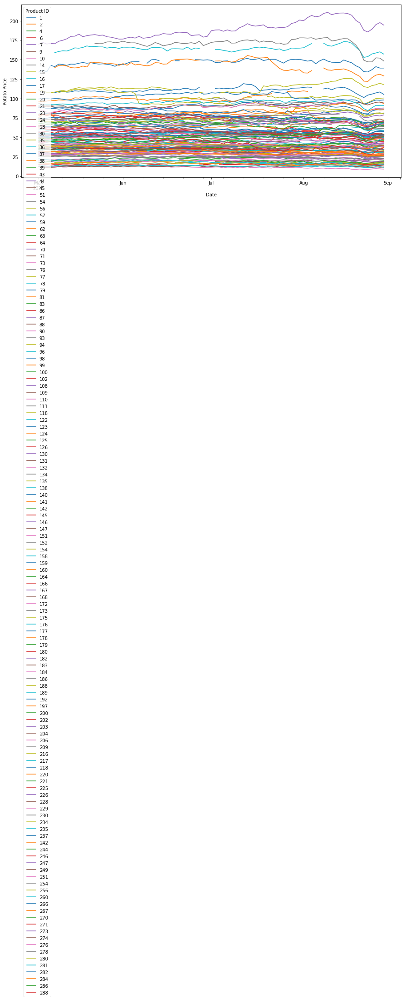

In [116]:
#Potato Price Trend Plot(exclude Product 227, 11, 236)
fig, ax = plt.subplots(figsize=(15,7))
position[~position["Product ID"].isin([227,11,236])].groupby(['Date','Product ID'])['Price'].mean().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Potato Price')

Text(0, 0.5, 'Average potato price')

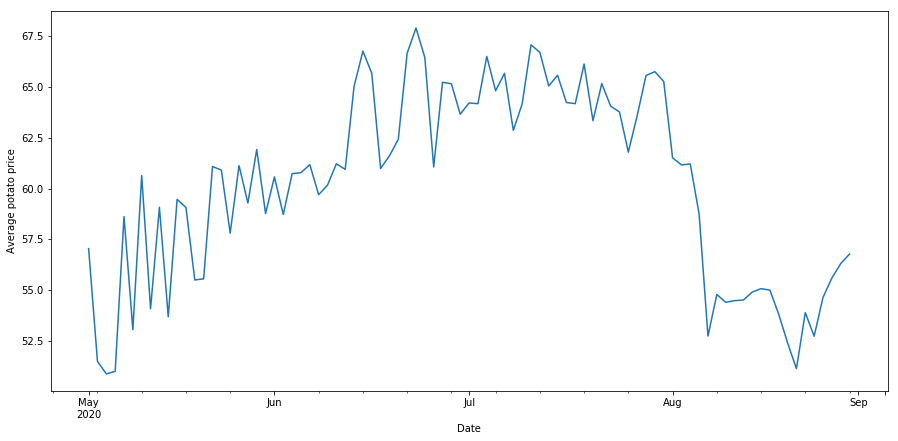

In [117]:
#Average potato price
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date'])['Price'].mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average potato price')

# Are there any factors that can help predict potato prices?
Since the data only contains a part of owners who have potato, it is resonable only take potato related information into consideration
<br>
1. Data cleaning: deal with missing value, outliers(I think all price values are normal)
2. Classify potato based on beta
3. Mixed Model
4. Model Evaluation
5. Model Interpretation
<br>
Linear Regression: R-squared not very high but overall coefficients of most factors in potato_info are significant and can be used to predict potato price 
<br>
Linear Mixed Model: in order to further detect if quantity has impact on price, however the result is not significant
<br>
Decision Tree: Provide a ranking of factor importance, and quantity is represented as an important factor

## Data Cleaning I

In [358]:
#Merge potato_info and position
potato=position[["Date","Product ID","Price"]].merge(potato_info,how="left",left_on='Product ID',right_on='Product ID')
potato=potato.drop(["Variety Name"],axis=1)
potato=potato.drop_duplicates(subset=potato.columns.get_values().tolist())
for col in potato.columns.get_values().tolist()[3:]:
    potato[col] = potato[col].astype('category',copy=False)
potato=potato.dropna()
potato.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10816 entries, 0 to 25878
Data columns (total 13 columns):
Date                             10816 non-null datetime64[ns]
Product ID                       10816 non-null int64
Price                            10816 non-null float64
Country                          10816 non-null category
Shape of tuber                   10816 non-null category
Colour of skin                   10816 non-null category
Colour of flesh                  10816 non-null category
Depth of eyes                    10816 non-null category
Smoothness of skin               10816 non-null category
Colour of base of lightsprout    10816 non-null category
Maturity                         10816 non-null category
Height of plants                 10816 non-null category
Frequency of berries             10816 non-null category
dtypes: category(10), datetime64[ns](1), float64(1), int64(1)
memory usage: 447.2 KB


UNITED KINGDOM    4565
-                 2728
NETHERLANDS       1355
IRELAND            992
FRANCE             529
UNITED STATES      370
CANADA              87
AFGHANISTAN         87
AUSTRIA             58
GERMANY             45
Name: Country, dtype: int64
Oval - long     3187
Oval            2911
Short - oval    2607
Long             795
Round            739
-                328
Very long        249
Name: Shape of tuber, dtype: int64
Cream                  3081
White                  2796
Red parti-coloured     1628
Yellow                 1576
Red                    1258
Blue parti-coloured     198
Blue                    172
-                       107
Name: Colour of skin, dtype: int64
Cream                 3785
Light yellow          3028
White                 1812
Medium yellow         1330
-                      473
Deep yellow            309
Parti-coloured red      79
Name: Colour of flesh, dtype: int64
Shallow                   5227
Shallow - medium          2052
Medium        

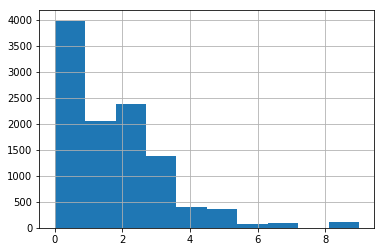

In [359]:
#Missing Value in categorical variables
#find out how many missing value("-")
for i in potato.columns.get_values().tolist()[3:]:
    print(potato[i].value_counts())
#how many rows containing missing values
x=potato.shape[0]-potato.loc[~potato.isin(["-"]).any(1)].shape[0]
print("{} rows contain missing value".format(x))
print("{}% of total data contain missing value".format(round(x*100/potato.shape[0],2)))
#missing value ditribution
cat=potato.columns.get_values().tolist()[3:]
(potato[cat] == "-").sum(axis=1).hist()
#remove observations containing more than 3 missing values and regard rest of "-" as a new value
potato["missing"]=(potato[cat] == "-").sum(axis=1)
potato=potato[potato["missing"]<=3]
potato=potato.drop(["missing"],axis=1)
x=potato.shape[0]-potato.loc[~potato.isin(["-"]).any(1)].shape[0]
print("{} rows contain missing value".format(x))
print("{}% of total data contain missing value".format(round(x*100/potato.shape[0],2)))

(9657, 13)

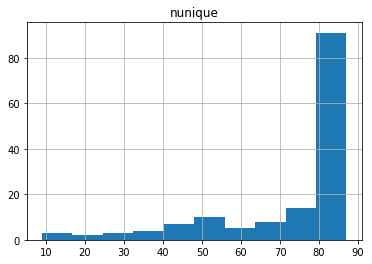

In [360]:
#New: keep the potato with historical data >=30 days
group=position.groupby("Product ID")["Date"].agg(["nunique"])
group.hist()
x=group[group["nunique"]>=30].index.tolist()
New=potato[potato["Product ID"].isin(x)]
New.shape

## Calculate Beta and weekly volatility
Most potato have a low beta and lower weekly volatility than market price volatility, which means the relationship between a single potato price and market potato price is not highly associated. Hence, market price trend may not be an efficient indicator for predicting most potato price.

In [361]:
#Calculate average potato price 
potato_price=pd.DataFrame({"Date":New["Date"].unique(),
                          "Average Potato Price":New.groupby("Date")["Price"].mean().tolist()})
product_id=New["Product ID"].unique().tolist()
for i in product_id:
    p=New[New["Product ID"]==i].loc[:,["Date","Price"]]
    potato_price=pd.merge(potato_price,p,how="left",left_on="Date",right_on="Date")
    potato_price=potato_price.rename(columns={"Price":str(i)})
potato_price.head()
def beta(product_id):
    d=potato_price.loc[:,["Average Potato Price",str(product_id)]]
    d=d.dropna()
    p=np.array(d[str(product_id)].pct_change())
    p=p[~np.isnan(p)]
    a=np.array(d["Average Potato Price"].pct_change())
    a=a[~np.isnan(a)]
    return (np.cov(a,p)/np.var(a))[0,1]
#Calculate weekly volatility of potato price
def vol(price):
    if len(price)%5==0:
        week=len(price)//5
    else:
        week=(len(price)//5)+1
    mean=[]
    for i in range(week):
        start=5*i
        end=5*i+5
        mean.append(np.mean(price[start:end]))
    return np.std(mean)
week_vol=[]
for i in product_id:
    price=New[New["Product ID"]==i]["Price"].tolist()
    week_vol.append(vol(price))
wv=pd.DataFrame({"Product ID":product_id,"Weekly Volatility":week_vol})
wv["Beta"]=np.nan
for i in wv["Product ID"]:
    wv.loc[wv["Product ID"] == i, 'Beta']=beta(i)
avg_potato_vol=vol(New.groupby("Date")["Price"].mean().tolist())
print("average potato price weekly volatility is {}".format(avg_potato_vol))
wv.head()

average potato price weekly volatility is 5.620422812370196


,Product ID,Weekly Volatility,Beta
0,131,0.423009,0.011202
1,14,0.495900,-0.015813
2,235,0.644596,-0.018570
3,90,1.268895,-0.026787
4,126,0.653648,-0.026125


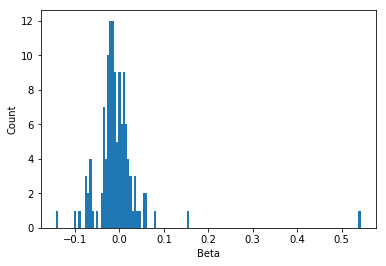

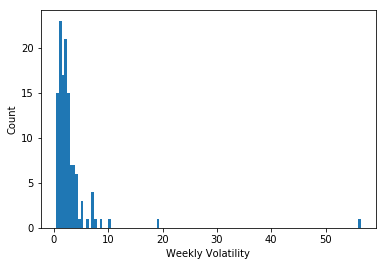

In [362]:
#Distribution of Beta
plt.hist(wv['Beta'], bins=np.arange(min(wv['Beta']), max(wv['Beta']) + 0.005, 0.005))
plt.xlabel("Beta")
plt.ylabel("Count")
plt.show()
#Distribution of weekly volatility
plt.hist(wv['Weekly Volatility'], bins=np.arange(min(wv['Weekly Volatility']), 
                                                 max(wv['Weekly Volatility']) + 0.5, 0.5))
plt.xlabel("Weekly Volatility")
plt.ylabel("Count")
plt.show()

### Time Seires Model: average potato price

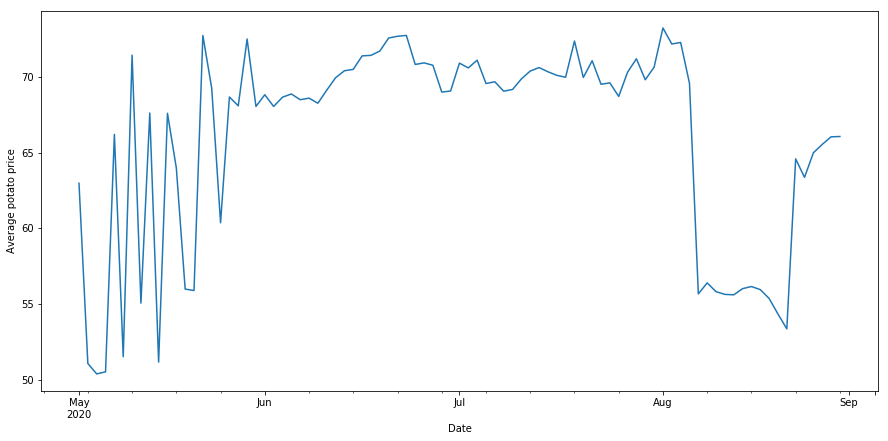

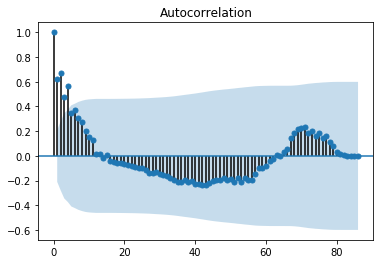

In [363]:
#Plot average potato price
potato_price=potato_price.set_index("Date")
fig, ax = plt.subplots(figsize=(15,7))
potato_price["Average Potato Price"].plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average potato price')
#ACF
plot_acf(potato_price["Average Potato Price"])
plt.show()

In [364]:
#Stationary ADF test
def adf(series):
    result = adfuller(series)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
adf(potato_price["Average Potato Price"])
adf(np.log(potato_price["Average Potato Price"]))#log transformation

ADF Statistic: -2.694902
p-value: 0.074925
Critical Values:
	1%: -3.522
	5%: -2.901
	10%: -2.588
ADF Statistic: -2.340489
p-value: 0.159242
Critical Values:
	1%: -3.513
	5%: -2.897
	10%: -2.586


ADF Statistic: -4.841612
p-value: 0.000045
Critical Values:
	1%: -3.513
	5%: -2.897
	10%: -2.586


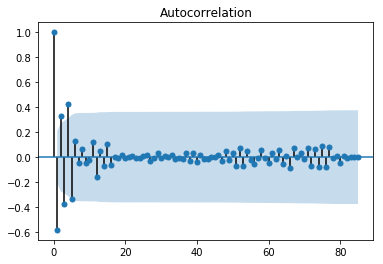

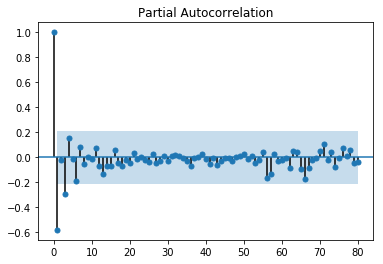

In [365]:
#First Difference
fd=potato_price["Average Potato Price"].diff(periods=1)
fd=fd[~fd.isnull()]
adf(fd)
plot_acf(fd)#ACF
plt.show()
plot_pacf(fd, lags=80) #PACF
plt.show()

                               ARIMA Model Results                                
Dep. Variable:     D.Average Potato Price   No. Observations:                   86
Model:                     ARIMA(1, 1, 1)   Log Likelihood                -254.165
Method:                           css-mle   S.D. of innovations              4.634
Date:                    Thu, 14 Mar 2019   AIC                            516.329
Time:                            15:57:46   BIC                            526.147
Sample:                        05-04-2020   HQIC                           520.280
                             - 08-31-2020                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                            0.1048      0.251      0.417      0.678      -0.388       0.597
ar.L1.D.Average Potato Price    -0.4148      

/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:646: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):
/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:650: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  elif issubdtype(paramsdtype, complex):
/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:577: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if issubdtype(paramsdtype, float):


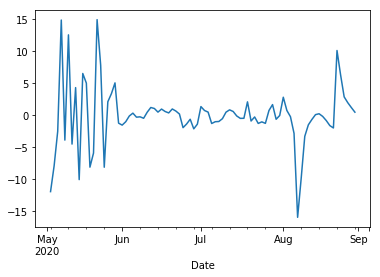

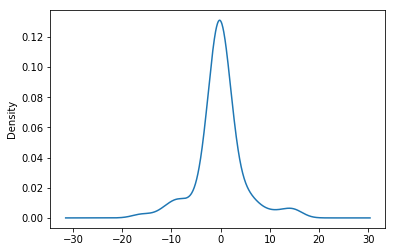

predicted average potato price is [66.08464766]
latest average potato price is 66.06930434782608


In [366]:
#ARIMA(2,2,1)
ts_model = ARIMA(potato_price["Average Potato Price"], order=(1,1,1))
model_fit = ts_model.fit()
print(model_fit.summary())
#plot residual errors
residuals=model_fit.resid
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
#forcase price
print("predicted average potato price is {}".format(model_fit.forecast()[0]))
print("latest average potato price is {}".format(potato_price["Average Potato Price"][-1]))

### Linear Mixed Model
1. Include extreme price values & ignore ordinal categorical variables
<br>
This case regard all variables as categorical variables and consider the random effects among different products, however most coefficients are not significant.
2. Exclude extreme price values & ignore ordinal categorical variables
<br>
Although some prices (Product 11, 227, 236) are extremely high and should be considered as outliers, those values actually are not likely to be unnormal data through previous plot, and I exclude those values in order to make comparison with previous model. 
<br>
The result seems not make a big different with previous one, it is resonable because each product has its own intercept, which is based on the mean price.
3. Include extreme price values & consider ordinal categorical variables
<br>
I noticed that several categorical variables actually are ordinal data, so I transfer them into ordinal numerical variables and thus decrease the number of categories, the next two models are done in R because the package lmer can better deal with this mixed model.
<br>
More coefficients are significant, especially: Colour_of_base_of_lightsproutPink, Colour_of_skin
4. Exclude extreme price values & consider ordinal categorical variables: same as 3

In [388]:
#Include extreme price values & ignore ordinal categorical variables
import statsmodels.api as sm
import statsmodels.formula.api as smf
potato_cat=potato.set_index("Date")
potato_cat.columns = potato_cat.columns.str.replace(' ', '_')
lm1=sm.MixedLM.from_formula(
    "Price~Country+Shape_of_tuber+Colour_of_skin+Colour_of_flesh+Depth_of_eyes+Smoothness_of_skin+Colour_of_base_of_lightsprout+Maturity+Height_of_plants+Frequency_of_berries", 
    data=potato_cat,groups=potato_cat["Product_ID"])
mdf = lm1.fit()
print(mdf.summary())

/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                     Mixed Linear Model Regression Results
Model:                              MixedLM                   Dependent Variable:                   Price      
No. Observations:                   9789                      Method:                               REML       
No. Groups:                         132                       Scale:                                31.4373    
Min. group size:                    9                         Likelihood:                           -31028.8245
Max. group size:                    87                        Converged:                            No         
Mean group size:                    74.2                                                                       
---------------------------------------------------------------------------------------------------------------
                                          Coef.       Std.Err.      z    P>|z|      [0.025           0.975]    
-----------------------------

/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/regression/mixed_linear_model.py:2001: ConvergenceWarning: Gradient optimization failed.
  warnings.warn(msg, ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/regression/mixed_linear_model.py:2039: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:1029: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(self.cov_params()))


In [389]:
#exclude extreme price values & ignore ordinal categorical variables
potato_cat_ex=potato_cat[~potato_cat['Product_ID'].isin([227,11,236])]
lm2=sm.MixedLM.from_formula(
    "Price~Country+Shape_of_tuber+Colour_of_skin+Colour_of_flesh+Depth_of_eyes+Smoothness_of_skin+Colour_of_base_of_lightsprout+Maturity+Height_of_plants+Frequency_of_berries", 
    data=potato_cat_ex,groups=potato_cat_ex["Product_ID"])
mdf = lm2.fit()
print(mdf.summary())

/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                 Mixed Linear Model Regression Results
Model:                             MixedLM                Dependent Variable:                Price      
No. Observations:                  9599                   Method:                            REML       
No. Groups:                        129                    Scale:                             9.5672     
Min. group size:                   9                      Likelihood:                        -24692.4935
Max. group size:                   87                     Converged:                         No         
Mean group size:                   74.4                                                                 
--------------------------------------------------------------------------------------------------------
                                         Coef.      Std.Err.     z    P>|z|     [0.025         0.975]   
-----------------------------------------------------------------------------------------

/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/regression/mixed_linear_model.py:2001: ConvergenceWarning: Gradient optimization failed.
  warnings.warn(msg, ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/regression/mixed_linear_model.py:2039: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/regression/mixed_linear_model.py:2372: RuntimeWarning: invalid value encountered in sqrt
  sdf[0:self.k_fe, 1] = np.sqrt(np.diag(self.cov_params()[0:self.k_fe]))
/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/a

In [495]:
#Include/exclude extreme price values & consider ordinal categorical variables
potato_m=potato_cat.replace('-', np.nan)
potato_m = potato_m.dropna()
#convert data type to categorical ordinal data
depth={"Very shallow":1,"Very shallow - shallow":2,"Shallow":3,"Shallow - medium":4,
       "Medium":5,"Medium - deep":6,"Deep":7,"Deep - very deep":8,"Very deep":9}
maturity={"Very early":1,"Very early to early":2,"Early":3,"First Early":4,"Second Early":5,"Early Maincrop":6,
          "Maincrop":7,"Early to intermediate":8,"Intermediate":9,"Intermediate to late":10,"Late":11,
         "Late Maincrop":12,"Late to very late":13,"Very late":14}
smoothness={"Rough":1,"Medium":2,"Smooth":3}
height={"Very short":1,"Short":2,"Short - medium":3,"Medium":4,"Medium - tall":5,"Tall":6,"Tall - very tall":7,"Very tall":8}
frequency={"Absent":1,"Few":2,"Medium":3,"Many":4,"Very many":5}
fresh={"White":1,"Cream":2,"Light yellow":3,"Medium yellow":4,"Deep yellow":5,"Parti-coloured red":6}
shape={"Short - oval":2,"Oval":3,"Oval - long":4,"Long":5,"Very long":5,"Round":1}
        
potato_m['Depth_of_eyes']=potato_m['Depth_of_eyes'].map(depth)
potato_m['Smoothness_of_skin']=potato_m['Smoothness_of_skin'].map(smoothness)
potato_m['Maturity']=potato_m['Maturity'].map(maturity)
potato_m['Height_of_plants']=potato_m['Height_of_plants'].map(height)
potato_m['Frequency_of_berries']=potato_m['Frequency_of_berries'].map(frequency)
potato_m['Shape_of_tuber']=potato_m['Shape_of_tuber'].map(shape)
potato_m['Colour_of_flesh']=potato_m['Colour_of_flesh'].map(fresh)
potato_m.to_excel('/Users/suedy/Desktop/potato_m.xlsx')
potato_m.head()
#R code
#potato<-read.csv('/Users/suedy/Desktop/potato_m.csv')
#summary(potato)
#library(ggplot2)
#install.packages("lme4")
#library(lme4)
#res1 = lmer(Price ~ Country+Shape_of_tuber+Colour_of_skin+Colour_of_flesh+Depth_of_eyes+Smoothness_of_skin+Colour_of_base_of_lightsprout+Maturity+Height_of_plants+Frequency_of_berries+(1|Product_ID), data = potato)
#summary(res1)
#logLikelihood = logLik(res1)
#deviance = -2*logLikelihood[1]; deviance
#p = 12 # number of parameters = 3 (fixed) + 1 (random)
#deviance + 2*(p+1)
#coef(res1)
#install.packages("lmerTest")
#library(lmerTest)
#res2 = lmer(Price ~ Country+Shape_of_tuber+Colour_of_skin+Colour_of_flesh+Depth_of_eyes+Smoothness_of_skin+Colour_of_base_of_lightsprout+Maturity+Height_of_plants+Frequency_of_berries+(1|Product_ID), REML = TRUE,data = potato)
#summary(res2)
#potato_new=potato[!(potato$Product_ID==227 & potato$Product_ID==11 & potato$Product_ID==236),]
#res3 = lmer(Price ~ Country+Shape_of_tuber+Colour_of_skin+Colour_of_flesh+Depth_of_eyes+Smoothness_of_skin+Colour_of_base_of_lightsprout+Maturity+Height_of_plants+Frequency_of_berries+(1|Product_ID), REML = TRUE,data = potato_new)
#summary(res3)


,Product_ID,Price,Country,Shape_of_tuber,Colour_of_skin,Colour_of_flesh,Depth_of_eyes,Smoothness_of_skin,Colour_of_base_of_lightsprout,Maturity,Height_of_plants,Frequency_of_berries
Date,,,,,,,,,,,,
2020-05-01,126,13.41,UNITED KINGDOM,1,White,1,3,3,Pink,6,3,1
2020-05-01,176,14.53,IRELAND,4,Red parti-coloured,3,3,3,Pink,9,3,3
2020-05-01,246,14.97,UNITED KINGDOM,4,Yellow,4,4,2,Violet,7,5,2
2020-05-01,16,15.49,UNITED KINGDOM,4,Cream,2,3,3,Blue,10,4,2
2020-05-01,164,17.76,NETHERLANDS,4,Cream,4,3,2,Blue,3,3,1


### Linear Regression
I delete all "-" value for linear regression otherwise it has to create too many dummy variables, and the same time it deletes the extreme value.
<br><br>
Linear regression looks good and the overall model and most coefficients are significant, just R-squared is not very high.

,Shape_of_tuber,Colour_of_flesh,Depth_of_eyes,Smoothness_of_skin,Maturity,Height_of_plants,Frequency_of_berries,CANADA,FRANCE,IRELAND,...,UNITED STATES,Blue parti-coloured,Cream,Red,Red parti-coloured,White,Yellow,Blue,Pink,Violet
Shape_of_tuber,1.000000,0.286303,0.299629,-0.258161,0.306724,0.412586,0.106507,0.274342,-0.009118,0.033208,...,-0.039613,0.209742,0.072042,0.086879,0.046497,-0.411416,0.144938,0.001878,0.076903,-0.107265
Colour_of_flesh,0.286303,1.000000,0.188646,-0.202515,0.075755,-0.159806,0.272878,-0.045332,0.237165,-0.033397,...,-0.128085,0.277990,0.003378,-0.064062,0.001859,-0.263742,0.272898,0.154870,-0.152074,0.038781
Depth_of_eyes,0.299629,0.188646,1.000000,-0.125795,0.372731,0.195916,0.074648,0.062979,0.055543,-0.233033,...,0.381741,0.186465,-0.151249,-0.134410,0.308203,-0.044766,-0.074779,0.040503,0.086399,-0.162472
Smoothness_of_skin,-0.258161,-0.202515,-0.125795,1.000000,-0.159204,-0.341807,0.032185,-0.162594,0.121249,-0.033756,...,-0.087019,0.210425,-0.074179,-0.100905,0.001843,0.229777,-0.276134,0.206529,-0.134136,-0.042222
Maturity,0.306724,0.075755,0.372731,-0.159204,1.000000,0.519272,0.411498,-0.168010,0.072396,0.034737,...,0.009629,0.140142,-0.263090,0.215040,0.272624,-0.123667,-0.143751,0.007328,0.105539,-0.152398
Height_of_plants,0.412586,-0.159806,0.195916,-0.341807,0.519272,1.000000,0.206393,0.178187,0.065758,0.174715,...,-0.053791,0.190222,-0.178675,0.255942,0.098409,-0.218039,0.011250,-0.062396,0.054343,-0.006149
Frequency_of_berries,0.106507,0.272878,0.074648,0.032185,0.411498,0.206393,1.000000,-0.154808,0.235733,0.092339,...,-0.046356,0.311222,-0.198634,0.074883,-0.026070,-0.009286,0.062299,0.212997,-0.237559,0.092202
CANADA,0.274342,-0.045332,0.062979,-0.162594,-0.168010,0.178187,-0.154808,1.000000,-0.019714,-0.082399,...,-0.041371,-0.034214,0.195434,-0.063187,-0.068120,-0.074062,-0.037963,-0.061011,0.088302,-0.054122
FRANCE,-0.009118,0.237165,0.055543,0.121249,0.072396,0.065758,0.235733,-0.019714,1.000000,-0.072671,...,-0.036487,0.576211,-0.100875,-0.055727,-0.060077,-0.065318,-0.033481,0.323130,-0.223262,-0.047732
IRELAND,0.033208,-0.033397,-0.233033,-0.033756,0.034737,0.174715,0.092339,-0.082399,-0.072671,1.000000,...,-0.152502,-0.126118,-0.251611,0.344061,0.084533,-0.180335,0.273796,-0.224896,-0.018018,0.270460


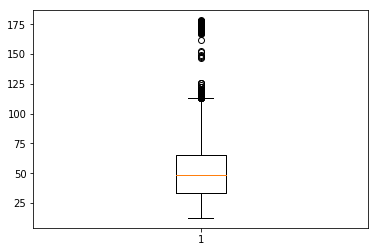

In [535]:
#Create dummy variable
potato_l=potato_m.copy()
for i in ["Country","Colour_of_skin","Colour_of_base_of_lightsprout"]:
    dummy=pd.get_dummies(potato_l[i]).iloc[:, 2:]
    potato_l=pd.concat([potato_l,dummy],axis=1)
potato_l=potato_l.drop(["Country","Colour_of_skin","Colour_of_base_of_lightsprout","AUSTRIA","GERMANY"],axis=1)
potato_l=potato_l.dropna()
#price boxplot
plt.boxplot(potato_l["Price"]) #extreme values are removed 
#correlation matrix
potato_l.iloc[:,2:].corr()


In [539]:
from sklearn import metrics
X = potato_l.iloc[:,2:]
y = potato_l['Price']
X = sm.add_constant(X)
lr1 = sm.OLS(y, X).fit() 
lr1_predict = lr1.predict(X)
print(lr1.summary())
print('Mean Absolute Error:', metrics.mean_absolute_error(y,lr1_predict))
print("MSE:", metrics.mean_squared_error(y,lr1_predict))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y,lr1_predict)))

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.412
Model:                            OLS   Adj. R-squared:                  0.409
Method:                 Least Squares   F-statistic:                     138.6
Date:                Fri, 15 Mar 2019   Prob (F-statistic):               0.00
Time:                        09:01:59   Log-Likelihood:                -17986.
No. Observations:                3979   AIC:                         3.601e+04
Df Residuals:                    3958   BIC:                         3.615e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   75.9715 

### Decision Tree
Decision tree is a very good method in regression with categorical data and also provide good interpretation
<br>
Important indicators: Colour_of_skin, Height of Plants, Color of Flesh

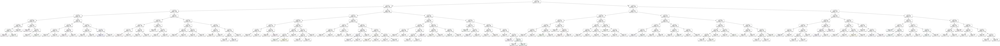

In [549]:
#Consider missing value & extreme value
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report
from sklearn import utils
from sklearn.metrics import mean_squared_error
from math import sqrt
potato_d=potato_cat.copy()
lab_enc = preprocessing.LabelEncoder()
for i in potato_d.columns.values.tolist():
    potato_d[i]=lab_enc.fit_transform(potato_d[i])
X=potato_d.iloc[:,2:]
y=potato_d['Price']
encoded = lab_enc.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, encoded, test_size=0.33, random_state=42)
dtc = DecisionTreeClassifier(criterion = "entropy", random_state = 100, min_samples_leaf=5)
dtc.fit(X_train, y_train)
y_dtc_pred=dtc.predict(X_test) 
#Draw Decision Tree
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [550]:
#Model Evaluation
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_dtc_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_dtc_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_dtc_pred)))
important_feature=pd.DataFrame({"feature":X_test.columns,"importance":dtc.feature_importances_})
important_feature.sort_values("importance",ascending=False,inplace=False).head(10)

Mean Absolute Error: 200.91519653358094
MSE: 127692.96904982977
RMSE: 357.34152998193446


,feature,importance
8,Height_of_plants,0.203318
2,Colour_of_skin,0.187695
3,Colour_of_flesh,0.115076
1,Shape_of_tuber,0.093469
0,Country,0.092156
9,Frequency_of_berries,0.086000
7,Maturity,0.066398
4,Depth_of_eyes,0.057651
6,Colour_of_base_of_lightsprout,0.050644
5,Smoothness_of_skin,0.047593


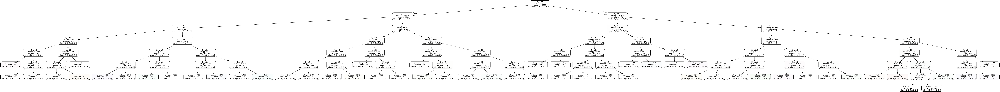

In [553]:
#Exclude missing value & extreme value
potato_d=potato_cat.replace('-', np.nan)
potato_d = potato_d.dropna()
lab_enc = preprocessing.LabelEncoder()
for i in potato_d.columns.values.tolist():
    potato_d[i]=lab_enc.fit_transform(potato_d[i])
X=potato_d.iloc[:,2:]
y=potato_d['Price']
encoded = lab_enc.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, encoded, test_size=0.33, random_state=42)
dtc = DecisionTreeClassifier(criterion = "entropy", random_state = 100, min_samples_leaf=5)
dtc.fit(X_train, y_train)
y_dtc_pred=dtc.predict(X_test) 

dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [554]:
#Model Evaluation
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_dtc_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_dtc_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_dtc_pred)))
important_feature=pd.DataFrame({"feature":X_test.columns,"importance":dtc.feature_importances_})
important_feature.sort_values("importance",ascending=False,inplace=False).head(10)

Mean Absolute Error: 106.87366818873669
MSE: 26392.511415525114
RMSE: 162.457721932585


,feature,importance
2,Colour_of_skin,0.245219
8,Height_of_plants,0.199388
7,Maturity,0.140572
3,Colour_of_flesh,0.117943
5,Smoothness_of_skin,0.116777
9,Frequency_of_berries,0.064554
1,Shape_of_tuber,0.053381
4,Depth_of_eyes,0.034219
6,Colour_of_base_of_lightsprout,0.021497
0,Country,0.006450


# Are there any factors that can help predict client activity? 
Since many quantities are not available, it is not suitable to use total quantity or stockpile as dependent variables, and I show the influence of clinet information and price with visualization, more can be found in Tableau
<br>
The result shows price, Product type can help predict client activity

In [584]:
#Create client data
client=pd.merge(position,client_info,how="left",left_on="Client ID",right_on="Client ID")
client=client[client['Quantity']>0]
client.columns = client.columns.str.replace(' ', '_')
client=client.drop(["Date","Market_Value","count_client","Daily_total_value_client","quantity_client","quantity_potato","First_Name_","Last_Name"],axis=1)
for col in ["Product_ID","Client_ID","Client_Type","Client_Location"]:
    client[col] = client[col].astype('category',copy=False)
client=client.dropna()
print(client.shape)
print(client.info())
client=client.set_index("Client_ID")
client.head()

(20686, 6)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 20686 entries, 0 to 25876
Data columns (total 6 columns):
Product_ID         20686 non-null category
Client_ID          20686 non-null category
Price              20686 non-null float64
Quantity           20686 non-null float64
Client_Type        20686 non-null category
Client_Location    20686 non-null category
dtypes: category(4), float64(2)
memory usage: 593.2 KB
None


,Product_ID,Price,Quantity,Client_Type,Client_Location
Client_ID,,,,,
38,131,12.02,7.0,Industrial,Midwest
64,131,12.02,52.0,Organic,North
74,14,12.43,31.0,Industrial,Northeast
50,14,12.43,103.0,Hydroponitc,North
38,14,12.43,917.0,Industrial,Midwest


### Decision Tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.170764 to fit



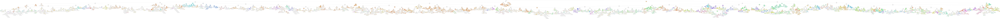

In [585]:
#include client 27, 38, 82
lab_enc = preprocessing.LabelEncoder()
for i in ["Product_ID","Client_Type","Client_Location"]:
    client[i]=lab_enc.fit_transform(client[i])
X=client[["Product_ID","Price","Client_Type","Client_Location"]]
y=client['Quantity']
encoded = lab_enc.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, encoded, test_size=0.33, random_state=42)
dtc = DecisionTreeClassifier(criterion = "gini", random_state = 100, min_samples_leaf=5)
dtc.fit(X_train, y_train)
y_dtc_pred=dtc.predict(X_test) 
#Draw Decision Tree
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


In [586]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_dtc_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_dtc_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_dtc_pred)))
important_feature=pd.DataFrame({"feature":X_test.columns,"importance":dtc.feature_importances_})
important_feature.sort_values("importance",ascending=False,inplace=False).head(5)

Mean Absolute Error: 410.9961915922074
MSE: 621371.6146184269
RMSE: 788.2712823758245


,feature,importance
1,Price,0.638861
0,Product_ID,0.274105
3,Client_Location,0.045484
2,Client_Type,0.041550


In [588]:
#exclude client 27, 38, 82
client=client.reset_index()
client_ex=client[~client['Client_ID'].isin([27,38,82])]
client_ex=client_ex.set_index("Client_ID")
client_ex.info()
client_ex.head()

<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 11125 entries, 64 to 94
Data columns (total 5 columns):
Product_ID         11125 non-null int64
Price              11125 non-null float64
Quantity           11125 non-null float64
Client_Type        11125 non-null int64
Client_Location    11125 non-null int64
dtypes: float64(2), int64(3)
memory usage: 446.2 KB


,Product_ID,Price,Quantity,Client_Type,Client_Location
Client_ID,,,,,
64,66,12.02,52.00,2,1
74,8,12.43,31.00,1,2
50,8,12.43,103.00,0,1
17,121,12.88,4.58,1,0
74,47,13.07,21.00,1,2


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0863105 to fit



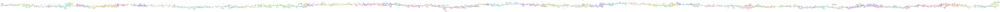

In [591]:
X=client_ex[["Product_ID","Price","Client_Type","Client_Location"]]
y=client_ex['Quantity']
encoded = lab_enc.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, encoded, test_size=0.33, random_state=42)
dtc = DecisionTreeClassifier(criterion = "gini", random_state = 100, min_samples_leaf=5)
dtc.fit(X_train, y_train)
y_dtc_pred=dtc.predict(X_test) 
#Draw Decision Tree
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [592]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_dtc_pred))
print("MSE:", metrics.mean_squared_error(y_test,y_dtc_pred))
print("RMSE:", np.sqrt(metrics.mean_squared_error(y_test,y_dtc_pred)))
important_feature=pd.DataFrame({"feature":X_test.columns,"importance":dtc.feature_importances_})
important_feature.sort_values("importance",ascending=False,inplace=False).head(5)

Mean Absolute Error: 222.04357298474946
MSE: 170708.08551198256
RMSE: 413.16835008502596


,feature,importance
1,Price,0.792014
0,Product_ID,0.115168
3,Client_Location,0.049585
2,Client_Type,0.043233
